<a href="https://colab.research.google.com/github/YuShenLu/data_for_MIE451/blob/main/sna_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Q1

My chosen tag is #iran

However, this tag contain too much tweets to be analyzed, and some of the tweets are not written in English

Therefore I pruned the data to only include tweets that are (probably) written in English (by pruning out all tweets with non ascii characters) on June 13th, 2009. (there are about 5000 emails that fit this criteria)

Sadly, because the data created a highly connected graph that is impossible to visualize, I further trimmed the data down to the last 1000 tweets on that day.

#Q2



###preprocessing 

In [2]:
! pip install networkx
! pip install plotly
! pip install colorlover
! pip install NRCLex


     |████████████████████████████████| 399kB 13.9MB/s 
  Created wheel for NRCLex: filename=NRCLex-3.0.0-cp36-none-any.whl size=43313 sha256=01bb2fca38349efbafe81404cf27fae61a0bcb5749ea5b2b548dcb384914927c
  Stored in directory: /root/.cache/pip/wheels/17/31/64/035a8d245b4c217aeb8e8a2702d05dc91544b9c2334db72414
Successfully built NRCLex


In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [179]:
import networkx as nx
import pandas as pd
from collections import Counter
import matplotlib 
import matplotlib.pyplot as plt
import numpy as np
import colorlover as cl
from IPython.display import HTML

In [180]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import *
import plotly.graph_objects as go
init_notebook_mode(connected=True)

In [181]:
df = pd.read_csv("/content/drive/MyDrive/MIE451_SNA/tweets2009-06-0115.csv", sep='\t')
df.head(100)

,date,user,tweet
0,2009-06-01 21:43:59,burtonator,No Post Title
1,2009-06-01 21:47:23,burtonator,No Post Title
2,2009-06-02 01:15:44,burtonator,No Post Title
3,2009-06-02 05:17:52,burtonator,No Post Title
4,2009-06-02 23:58:25,burtonator,No Post Title
...,...,...,...
95,2009-06-08 22:00:30,legrandbazart,New blog post: Chimera Music http://bit.ly/xAKU3
96,2009-06-08 22:00:30,marramskoorb,i hope there is a chowder or flapjack episode ...
97,2009-06-08 22:00:30,mrsminifig,"@sebduggan ooh ooh, I haven't watched it yet....."
98,2009-06-08 22:00:30,tony_gai,@applesorce おお・・・ちょっと欲しいかもです！


In [182]:
print("Num of rows:", df.shape[0])
allTweets = df["tweet"].str.cat(sep=' ')
tweetWords = [word.strip(""" ,.:'\";""").lower() for word in allTweets.split()]
hashTags = [word for word in tweetWords if word.startswith("#")]
hashTagsCounter = Counter(hashTags)

Num of rows: 3437690


In [183]:
# hashTagsCounter.most_common(150)

create df with #iran

In [184]:
# make a new dataframe just with our hashtag
my_tag = '#iran'
iranTag = df[df["tweet"].str.lower().str.contains(my_tag, na=False)].copy()

There are non english post

In [185]:
iranTag.head(100)
i = 0
for tweet in iranTag['tweet']:
  print(tweet)
  i+=1
  if i>20:
    break

#IranElection "Let's... extend the campaign to four years!" Iranians enjoy dancing in the street during rallies. http://ow.ly/dxKx -mm
RT @mythary: Iranian expats check out where to vote in the world: http://bit.ly/3N4YcC #IranElection -mm
What does a lawn sign look like in an Iranian election? http://twurl.nl/lbj43x #roft #cdnleft #tcot #tlot #elections #iran
US contextualizing of #IranElection reaches laughable hyperbole: Nejad is Gore, Palin, Bush, AND Carter, all in 1 article! http://is.gd/Z0WZ
شعبه های اخذ رای ده%D... (http://cli.gs/M7BSvB) #iranelection
@j_tigers Awesome Mousavi campaign song http://bit.ly/uXXVp #iranelections
RT @jezebel 10 Reasons Why You Should Be Following The Iranian Elections http://jezebel.com/5287202 #womenrule #iranianelections
Searched Twitter for #iran elections : http://tinyurl.com/nsjhay
Iranian Candidate Turns to Twitter http://online.wsj.com/article/SB124474838231207211.html #iran elections
RT @keyvan Iranians in the US can vote from these stations

In [186]:
def isEnglish(s):
    try:
        s.encode(encoding='utf-8').decode('ascii')
    except UnicodeDecodeError:
        return False
    else:
        return True

def in_one_day(date):
  if date.startswith("2009-06-13"):
    return True
  return False

In [187]:
language = iranTag['tweet'].apply(isEnglish)
language.groupby(language==True).count()
date = iranTag['date'].apply(in_one_day)
date.groupby(date==True).count()

date
False    24911
True      5432
Name: date, dtype: int64

In [188]:
iranTag = iranTag[(language == True)&(date == True)]

there are still too many tweets, only keep 1000 tweets

In [189]:
iranTag_original = iranTag
iranTag = iranTag[-1000:]
assert iranTag.shape[0] == 1000

In [190]:
def addMentionedColumn(df):
    
    def mentionsList(txt):
        allWords = [word.strip(""" ,.:'\";""").lower() for word in txt.split()]
        allNames = [word.strip("@") for word in allWords if word.startswith("@")]
        uniqueNames = list(set(allNames))
        return allNames
    
    df["mentioned"] = df["tweet"].apply(mentionsList)

In [191]:
addMentionedColumn(iranTag)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [192]:
# for all the tweets with your hashtag, build the mention graph
def mentionGraph(df):
    g = nx.Graph()
    
    for (index, date, user, tweet, mentionedUsers) in df.itertuples():
        for mentionedUser in set(mentionedUsers): # remove duplicated mentions
            if (user in g) and (mentionedUser in g[user]):
                g[user][mentionedUser]["numberMentions"] += 1
            else:
                g.add_edge(user, mentionedUser, numberMentions=1)
    
    return g

In [193]:
iranGraph = mentionGraph(iranTag)

In [194]:
iranGraph.remove_node("")


In [195]:
iranGraph.remove_edges_from(nx.selfloop_edges(iranGraph))


##Q2a

there are 564 nodes and 979 edges in the graph (after removing empty mentions and self loops)

In [196]:
print("# nodes:", len(iranGraph.nodes()))
print("# edges:", len(iranGraph.edges()))

# nodes: 564
# edges: 979


In [197]:
degree_dict = {node:nx.degree(iranGraph, node) for node in iranGraph.nodes}

##Q2b

There is a lot of nodes low number of mentions and a few with very high number of mentions.
I think this means that the graph is centered around a few very high mention nodes, (a lot of regular users interacting with a few very active account, but not with each other)

Text(0.5, 0, '# of mentions')

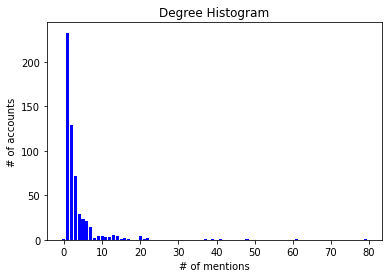

In [198]:
G = iranGraph
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)  # degree sequence
degreeCount = Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

fig, ax = plt.subplots()
plt.bar(deg, cnt, color="b")

plt.title("Degree Histogram")
plt.ylabel("# of accounts")
plt.xlabel("# of mentions")
# ax.set_xticks([d + 0.4 for d in deg])
# ax.set_xticklabels(deg)

In [199]:

A = pd.DataFrame.from_dict(degree_dict, orient='index', columns=['degree'])
A.reset_index(inplace=True)
df_degree = A.groupby('degree').count()
df_propotion = df_degree.apply(lambda x: x/x.sum())

##Q2c 

my graph has a general trend of the power law but with some gaps at around degree 10. I think this means that most users with low mentions are only interacting with the ones with very high mentions but not with each other, so there is no "moderately active" users, only somewhat engaged users centering around a handful of very big accounts. 

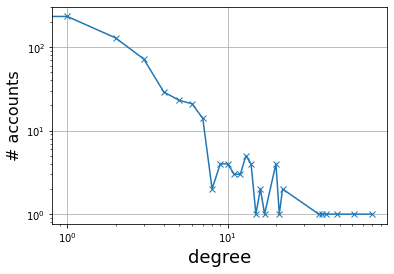

In [200]:

x = np.array(df_degree.index.tolist())
y = np.array(df_degree.values.tolist()).squeeze()

fig = plt.figure()

plt.loglog(x, y, marker='x')
plt.xlabel('degree', fontsize=18)
plt.ylabel('# accounts', fontsize=16)

plt.grid(True)
plt.show()

In [201]:
max_mention = 0
max_couple = None
for node1, node2 in iranGraph.edges():
  mention = iranGraph[node1][node2]['numberMentions']
  if mention > max_mention:
    max_mention = mention
    max_couple = node1, node2
print(max_couple, max_mention)
nodeA, nodeB = max_couple

('stopahmadi', 'trekkerguy') 9


In [202]:
def mentioned_A(name):
  if nodeA in name:
    return True
  return False

def mentioned_B(name):
  if nodeB in name:
    return True
  return False
  

##Q2d

The two user with highest mention are 'stopahmadi' and 'trekkerguy', with 9 mentions. However, this interaction is completely one-side, with 'trekkerguy' retweeting content from 'stopahmadi' for all 9 interactions.




In [203]:
connection_AB = iranTag[(iranTag['user']==nodeB) & (iranTag['mentioned'].apply(mentioned_A))]
connection_BA = iranTag[((iranTag['user']==nodeA) & (iranTag['mentioned'].apply(mentioned_B))) ]
print("{} tweeted at {}:".format(nodeB, nodeA))
for i in connection_AB['tweet']:
  print(i)
print("="*20)
print("{} tweeted at {}:".format(nodeA, nodeB))
for i in connection_BA['tweet']:
  print(i)

trekkerguy tweeted at stopahmadi:
RT @utbrp If you haven't already followed @StopAhmadi please follow. He is at 650 followers... #IranElection
RT @utbrp If you haven't already followed @StopAhmadi please follow. He is at 650 followers... #IranElection
RT @StopAhmadi I'll be back in 15 mins. Keep the tweets coming and RT this http://www.iran101.blogspot.com/ #iranelection
RT @StopAhmadi I'll be back in 15 mins. Keep the tweets coming and RT this http://www.iran101.blogspot.com/ #iranelection
RT @StopAhmadi TIME photo stream http://bit.ly/8BOJU #iranelection #newiran
RT @StopAhmadi RT @Iranelection88 Gathering in solidarity with Iranian people VANCOUVER CONVENTION CENTER 4-8:30.SUN. JUNE 14 #iranelection
RT @StopAhmadi The telecommunication building in Amirabad, Tehran is on fire! #iranelection #newiran
RT @StopAhmadi If u have an Iranian Embassy nearby, gather some ppl and protest, let the Iranian regime go down! #iranelection
RT @StopAhmadi UK NEWS REPORTS ON #IranElection http://bit.l

##Q2e

In [204]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [205]:
import random
def addRandomPositions(graph):
    posDict = dict((node,(random.gauss(0,10),random.gauss(0,10))) for node in graph.nodes())
    nx.set_node_attributes(graph, name="pos", values=posDict)

In [206]:
addRandomPositions(iranGraph)

In [207]:
# map purd color scale to 300 cells
purd = cl.scales['9']['seq']['YlGnBu']
purd300 = cl.interp(purd, max_mention+1)
HTML(cl.to_html(purd300))

In [208]:
def plotNetwork(graph):
    scatters=[]
    # map purd color scale to 300 cells
    purd = cl.scales['9']['seq']['YlGnBu']
    purd300 = cl.interp(purd, max_mention)
    HTML(cl.to_html(purd300))
    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']        
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color=purd300[edgeWidth-1]))
        scatters.append(s)



    for node in graph.nodes():
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                hoverinfo='none',
                mode='markers', 
                marker=dict(
                    color="#888", 
                    size=nx.degree(graph,node),         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False, height=600, width=800)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [209]:
def applyLayout(graph, layoutFunc):
    posDict = layoutFunc(graph) 
    nx.set_node_attributes(graph, name="pos", values=posDict)

The edge width and color reflect the edge weight (darker color is heavier weight)


In [210]:
iranGraphCircular = iranGraph.copy()
applyLayout(iranGraphCircular, nx.circular_layout)
configure_plotly_browser_state()
plotNetwork(iranGraphCircular)


# Q3


In [211]:
import sys
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Data Packages
import math
import pandas as pd
import numpy as np

#Progress bar
from tqdm import tqdm

#Counter
from collections import Counter

#Operation
import operator

#Natural Language Processing Packages
import re
import nltk

## Download Resources
nltk.download("vader_lexicon")
nltk.download("stopwords")
nltk.download("averaged_perceptron_tagger")
nltk.download("wordnet")
nltk.download('punkt')
from nltk.sentiment import SentimentAnalyzer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.sentiment.util import *
from nltk import tokenize
from nltk.corpus import stopwords
from nltk.tag import PerceptronTagger
from nltk.data import find

## Machine Learning
import sklearn
import sklearn.metrics as metrics

## Data Visualization
import folium
from tabulate import tabulate
from scipy.stats.kde import gaussian_kde

## Geolocation
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from nltk.tokenize import *

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [212]:
lemmatizer = nltk.WordNetLemmatizer()
stemmer = nltk.stem.porter.PorterStemmer()

def get_stop_words():
    stop = set(stopwords.words('english'))
    stop.add('iranelection')
    stop.add('iranelections')
    stop.add('iran')
    stop.add('iranian')
    return stop

# stemming, lematizing, lower case... 
def normalise(word,lemmatizer=lemmatizer, stemmer=stemmer):
    """Normalises words to lowercase and stems and lemmatizes it."""
    word = word.lower()
    # word = stemmer.stem(word)
    word = lemmatizer.lemmatize(word)
    return word

def getTopKWords(df, kwords, tokenizer):

    stop = get_stop_words()
    counter = Counter()

    reviews = df['tweet'].values

    for review in reviews:
        counter.update([normalise(word) 
                            for word 
                            in tokenizer.tokenize(review) 
                            if word.lower() not in stop and len(word) > 2])
    topk = counter.most_common(kwords)
    return topk

##Q3a

the top 10 nonstop words (I also removed the tag itself, and iranelection tag) in the dataset and their respective occurrence are:

('http', 500),
 ('bit', 290),
 ('tehran', 251),
 ('stopahmadi', 158),
 ('com', 150),
 ('newiran', 129),
 ('people', 121),
 ('mohamadreza', 100),
 ('mousavi', 100),
 ('mousavi1388', 92)


 It seems that most of the tweets are sharing links, and many top frequent words are twitter accounts. "people" and "newiran" are probably refering to the political protest happening right after the iran election in June, 2009. "newiran" is another tag that is closely associated with both the iran election protest and the losing candidate's policy. Tehran is the capital of Iran, and stopahmadi is a twitter account created to unite supporter for the losing presdential candidate (Mir-Hossein Mousavi) against the winning candidate (Mahmoud Ahmadinejad)
 
 Another reason why there are so many links are probably because people are suffering from a celluar signal blackout in these days (iran government seems to cut off the means of communication to prevent people from organizing protest), so people are uploading video reporting the situation in iran and calling for attention.


In [213]:
tokenizer = RegexpTokenizer('\w+|\$[\d\.]+')

topk = getTopKWords(iranTag, 10, tokenizer)
topk

[('http', 500),
 ('bit', 290),
 ('tehran', 251),
 ('stopahmadi', 158),
 ('com', 150),
 ('newiran', 129),
 ('people', 121),
 ('mohamadreza', 100),
 ('mousavi', 100),
 ('mousavi1388', 92)]

In [214]:
user_common_word = {}
for node in iranGraph.nodes:
  top3 = getTopKWords(iranTag[iranTag['user']==node], 3, tokenizer)
  user_common_word[node] = top3


In [215]:
def plotNetwork_with_hover(graph):
    scatters=[]
    # map purd color scale to 300 cells
    purd = cl.scales['9']['seq']['YlGnBu']
    purd300 = cl.interp(purd, max_mention)
    HTML(cl.to_html(purd300))
    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']        
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=1 ,color=purd300[edgeWidth-1]))
        scatters.append(s)



    for node in graph.nodes():
        common_words = user_common_word[node]
        if not common_words:
          color = 'red'
        else:
          color = '#888'
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                hovertext=str(node)+": "+' '.join([word for word, num in common_words]),
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color=color, 
                    size=nx.degree(graph,node),
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False, height=600, width=800)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

##Q3b
nodes with no words are highlighted in red.


Most of the tweets are talking about the same topic, most connected nodes do not identical top 3 words, but they all center around the protest and the election, and a lot of links are shared. many connected nodes share 1 top words.

The graph is highly connected and hard to read, so I provided two layouts here to try to make it a little easier to see. 

The spring layout show that most of the tweets are connected, with a few very high degreed nodes at the center. The circular layout make the connection a little clearer for the nodes clustered at the center of the spring layout.


In [216]:
iranGraphSpring = iranGraph.copy()
applyLayout(iranGraphSpring, nx.spring_layout)
configure_plotly_browser_state()
plotNetwork_with_hover(iranGraphSpring)

In [217]:
iranGraphCircular = iranGraph.copy()
applyLayout(iranGraphCircular, nx.circular_layout)
configure_plotly_browser_state()
plotNetwork_with_hover(iranGraphCircular)

#Q4


In [218]:
def plotNetwork_w_centrailty(graph, cent):
    scatters=[]
    max_size = max(cent.values())
    scale = 10/max_size
    # map purd color scale to 300 cells
    purd = cl.scales['9']['seq']['YlGnBu']
    purd300 = cl.interp(purd, max_mention)
    HTML(cl.to_html(purd300))
    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']        
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=1, color='#888'))
        scatters.append(s)



    for node in graph.nodes():
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                mode='markers', 
                hovertext=str(node),
                hoverinfo='text',
                marker=dict(                    
                    color="#888", 
                    size=1+((cent[node])*scale)**2,         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False, height=600, width=800)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [219]:
cent_between = nx.betweenness_centrality(iranGraph)

In [220]:
a = list(cent_between.values())
a.sort()
a[int(len(a)/2)]

0.0

In [221]:
cent_pr = nx.pagerank(iranGraph)

In [222]:
cent_dg = nx.degree_centrality(iranGraph)

##Q4a
1.betweenness as a centrality measure:
larger node size means higher betweenness

In [223]:
iranGraphCircular = iranGraph.copy()
applyLayout(iranGraphCircular, nx.circular_layout)
configure_plotly_browser_state()
plotNetwork_w_centrailty(iranGraphCircular, cent_between)

In [224]:
iranGraphSpring = iranGraph.copy()
applyLayout(iranGraphSpring, nx.spring_layout)
configure_plotly_browser_state()
plotNetwork_w_centrailty(iranGraphSpring, cent_between)

##Q4a
2. pagerank as a centrality measure:
larger node size means higher pagerank

In [225]:
iranGraphCircular = iranGraph.copy()
applyLayout(iranGraphCircular, nx.circular_layout)
configure_plotly_browser_state()
plotNetwork_w_centrailty(iranGraphCircular, cent_pr)

In [226]:
iranGraphSpring = iranGraph.copy()
applyLayout(iranGraphSpring, nx.spring_layout)
configure_plotly_browser_state()
plotNetwork_w_centrailty(iranGraphSpring, cent_pr)

In [227]:
from operator import itemgetter
def find_top(test_dict, N):
  res = dict(sorted(test_dict.items(), key = itemgetter(1), reverse = True)[:N]) 
  return res

##Q4b
top 5 betweeness:

| word w top betweenness   |   betweenness |
|--------------------------|---------------|
| stopahmadi               |     0.206672  |
| mohamadreza              |     0.14276   |
| mousavi1388              |     0.122715  |
| formerstortje            |     0.104214  |
| gita                     |     0.0744024 |

top 5 pagerank:

| word w high pagerank   |   pagerank |
|------------------------|------------|
| stopahmadi             |  0.0304854 |
| mohamadreza            |  0.0228651 |
| mousavi1388            |  0.0210859 |
| formerstortje          |  0.0172302 |
| gita                   |  0.0143225 |

Both the words and the order are identical for pagerank and betweenness.
I think this might be due to fact the network is centered around a handful of very highly connected nodes (stopahmadi is used to organize mousavi supporters and mousavi1388 is MirHossein Mousavi)

(A side note, mousavi1388 might actually have higher pagerank and betweenness because it is the political candidate himself, but most of his tweets are not in English, so I threw those out in the beginning since I cannot do analysis over language that I do not know...)

I think that pagerank might be more useful in this because it shows the influence of a particular node in the network (if a node with high pagerank such as the presidential candidate mousavi1388 mentions stopahmadi, it means it should have a high influence) Betweenness does not contain such information...

However, in my case, both measure gives very similar result, it is possibly becasue that most nodes are centered around a few very influential nodes, and centrality measure tend to agree in those cases. 


In [228]:
from tabulate import tabulate

In [229]:
t1 = find_top(cent_between, 5)
t2 = find_top(cent_pr, 5)

headers1 = ['word w top betweenness', 'betweenness']
headers2 = ['word w high pagerank', 'pagerank']
print(tabulate(t1.items(), headers1, tablefmt="github"))
print(tabulate(t2.items(), headers2, tablefmt="github"))

| word w top betweenness   |   betweenness |
|--------------------------|---------------|
| stopahmadi               |     0.206672  |
| mohamadreza              |     0.14276   |
| mousavi1388              |     0.122715  |
| formerstortje            |     0.104214  |
| gita                     |     0.0744024 |
| word w high pagerank   |   pagerank |
|------------------------|------------|
| stopahmadi             |  0.0304854 |
| mohamadreza            |  0.0228651 |
| mousavi1388            |  0.0210859 |
| formerstortje          |  0.0172302 |
| gita                   |  0.0143225 |


In [230]:
t1

{'formerstortje': 0.10421447680259854,
 'gita': 0.07440237052257886,
 'mohamadreza': 0.14275962714274712,
 'mousavi1388': 0.12271531084150733,
 'stopahmadi': 0.20667163917462394}

In [231]:
t2

{'formerstortje': 0.017230182326714878,
 'gita': 0.014322479581502312,
 'mohamadreza': 0.022865060488708996,
 'mousavi1388': 0.021085912088201996,
 'stopahmadi': 0.030485373431714948}

#Q5 

## I completed the user study on Nov 30 at 12:39AM using username: yushen.lu@mail.utoronto.ca

#Q6

##Q6a

all tweets are already sorted by time, so I kept the first 800 tweets for training (out of 1000 tweets in total)

the orginal graph have 564 nodes and 979 edges

the training graph have 81 fewer nodes, 143 fewer edges
(483 nodes and 836 edges)



In [232]:
import matplotlib.pyplot as plt


In [233]:
iranTag_train = iranTag.iloc[:800]
iranTag_test = iranTag.iloc[800:]

In [234]:
iranTag_train

,date,user,tweet,mentioned
2405636,2009-06-13 22:42:35,audrain,RT@AntoniaZ: Is it melodramatic of me to belie...,[]
2405664,2009-06-13 22:42:38,formerstortje,RT @StopAhmadi: Rumours say ppl have taken ove...,"[stopahmadi, tajrish]"
2405721,2009-06-13 22:42:46,buthaina,RT @mohamadreza Pictures from Tehran http://bi...,[mohamadreza]
2405749,2009-06-13 22:42:50,argyle13,RT @y_shar: The rumors are spreading faster......,[y_shar]
2405752,2009-06-13 22:42:50,donjipez,RT @formerstortje: RT @weddady: help us organi...,"[formerstortje, weddady]"
...,...,...,...,...
2450863,2009-06-13 23:46:38,brianfalldincom,"Rumor has it RT @mousavi1388 - ""...Mousavi ......",[mousavi1388]
2450933,2009-06-13 23:46:45,grandmofhelsing,RT @jaketapper the Iranian police confiscating...,[jaketapper]
2451002,2009-06-13 23:46:48,joshauerbach,Andrew Sullivan: Iran's election results as th...,[]
2451087,2009-06-13 23:46:52,adelemarie,"RT @mousavi1388 Dear Iranian People, Mousavi h...",[mousavi1388]


In [235]:
import heapq

def nodes_connected(u, v, G):
  return u in G.neighbors(v)

def check_results_of_prediction(pred_list, G):
  output = {}
  for (node1, node2, coef) in pred_list:
    val = nodes_connected(node1,node2, G)

    print(f"{node1} {node2} -> {val}")
    output[(node1,node2)] = val
  return output

In [236]:
iranGraph_train =mentionGraph(iranTag_train)
iranGraph_test = mentionGraph(iranTag_test)
iranGraph_train.remove_edges_from(nx.selfloop_edges(iranGraph_train))
iranGraph_train.remove_node('')
iranGraph_test.remove_edges_from(nx.selfloop_edges(iranGraph_test))
iranGraph_test.remove_node('')

edge_subset = iranGraph_test.edges

In [237]:
print("# nodes:", len(iranGraph.nodes()))
print("# edges:", len(iranGraph.edges()))

# nodes: 564
# edges: 979


In [238]:
print("# nodes:", len(iranGraph_train.nodes()))
print("# edges:", len(iranGraph_train.edges()))

# nodes: 483
# edges: 836


##Q6b

I chosed 3 methods:

I think the preferential attachment is going to be most effective.

jaccard_coefficient: it looks at the propotion of common neighbors shared by the nodes, I think it might be useful because I am doing prediction with nodes with high degrees, and they are likely to be indirectly connected, which means they probably have shared neighbors. I think this might be the least useful link prediction algorithm among the three since there are a lot of nodes connecting to a few central nodes (which is organizing the protest and being a platform to share information for the Iranians), but it does not mean that those nodes are very likely to connect to each other. 

preferential_attachment: I think this might be the best performing link prediction because I know that my graph is centered around the handful of very highly connected nodes. I know that the highly active ones are probably going to connect to more nodes (because the graph is structured this way); rather, two not-so-active nodes sharing the same neighbor (of the center, most influential nodes) are not that likely to connect to each other. (recall the gap of "moderately active nodes" in the loglog graph in Q2)

resource_allocation_index: This also looks at common neighbors, but it weights neighbors with low degree heavier, which I think will be useful in this graph. Since most nodes are connected to the handful of central nodes, it is not that likely that all those nodes are going to connect to each other, but if they have common friends with low degree, I guess it means that they are more likely to know each other in real life and form connection (mention) in the future.



In [239]:
core_graph2 = iranGraph_train.copy()
for node in iranGraph_train.nodes:
  if nx.degree(iranGraph, node)<3:
    core_graph2.remove_node(node)

In [240]:
prediction_jaccard = nx.jaccard_coefficient(core_graph2)
preferential_attachment = nx.preferential_attachment(core_graph2)
resource_allocation_index = nx.resource_allocation_index(core_graph2)
j_fivelargest = heapq.nlargest(5, prediction_jaccard, key = lambda x: x[2])
p_fivelargest = heapq.nlargest(5, preferential_attachment, key = lambda x: x[2])
r_fivelargest = heapq.nlargest(5, resource_allocation_index, key = lambda x: x[2])


##Q6c



Accuracy:

- jaccard_coefficient: 0%

- preferential_attachment: 40%

- resource_allocation_index: 20%

There are potentially 17826 edges that can be formed (# of edges that can be formed in pairs of nodes that does not already have edges), and the maximum correct prediction is 58 (among the removed egdes, 58 edges have both nodes exist in the core graph), which makes blind guess accuracy ~0.3%, this means that the 20% and 40% here is extremely impressive.


As predicted, preferential attachment worked the best

I think it is because my graph is centered around the handful of very highly connected nodes. (people are using those nodes to share information about iran and the election protest because twitter was the only open information sharing platform for Iranian at the time, you can check this news report for more info https://www.cbsnews.com/news/twitter-tells-tale-of-iran-election/)

It make sense that more user started to be aware of the platform and increasing using them to share information. Which fits preferential attachment's "rich gets richer" hypothesis.


In [241]:
core_node_edge_subset2 = [(node1, node2) for node1, node2 in edge_subset if (node1 in core_graph2.nodes) and (node2 in core_graph2.nodes)]

In [242]:
len(core_node_edge_subset2) # number of possible correct predictions

58

In [243]:
res_j = check_results_of_prediction(j_fivelargest, iranGraph) # jaccard coefficient 


shelisrael chrismessina) -> False
pinot mim_armand -> False
scottschram rjkeller -> False
amyjudd drkent -> False
adelemarie rjkeller -> False


In [244]:
res_p = check_results_of_prediction(p_fivelargest, iranGraph)


mohamadreza stopahmadi -> True
mohamadreza iran09 -> False
gita mohamadreza -> False
mousavi1388 stopahmadi -> False
mohamadreza formerstortje -> True


In [245]:
res_r = check_results_of_prediction(r_fivelargest, iranGraph)

mohamadreza stopahmadi -> True
mohamadreza mousavi1388 -> False
mohamadreza mahdi -> False
gita mohamadreza -> False
mousavi1388) marcambinder -> False


In [246]:
def plotNetwork_with_hover_with_pediction(graph, res, no_node_size=False):
    scatters=[]
    edge_set = [(node1,node2) for (node1, node2) in res]
    # map purd color scale to 300 cells
    purd = cl.scales['9']['seq']['YlGnBu']
    purd300 = cl.interp(purd, max_mention)
    HTML(cl.to_html(purd300))
    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        color = '#888'
        width = 1

        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=width ,color=color))
        scatters.append(s)
    for (node1, node2) in edge_set:
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        if (node1, node2) in res or (node2, node1) in res:
          if res.get((node1, node2)) is True or res.get((node2, node1)) is True:
            color = 'green'
            width = 3
          else:
            color = 'red'
            width = 3
        else:
          color = '#888'
          width = 1

        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=width ,color=color))
        scatters.append(s)


    for node in graph.nodes():
        common_words = user_common_word[node]
        if not common_words:
          color = 'red'
        else:
          color = '#888'
        xPos, yPos = graph.nodes[node]['pos']
        if no_node_size:
          size = 1
        else:
          size = nx.degree(graph,node)

        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                hovertext=str(node)+": "+'degree {}'.format(nx.degree(graph,node)),
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color=color, 
                    size=size,
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False, height=600, width=800)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

###Prediction visualization of Jaccard 
(notice two of the 5 edges are at between two very close nodes)

They are all between low degree nodes



In [247]:
core_graphCircular = core_graph2.copy()
applyLayout(core_graphCircular, nx.circular_layout)
configure_plotly_browser_state()
plotNetwork_with_hover_with_pediction(core_graphCircular, res_j)

###Prediction visualization of preferential attachment 
notice that all new edges are from the nodes with very high degree 

the green lines are covered by the large nodes...

The second graph shows the correctly predicted links (by forcing all nodes size to be small)

In [248]:
core_graphCircular = core_graph2.copy()
applyLayout(core_graphCircular, nx.circular_layout)
configure_plotly_browser_state()
plotNetwork_with_hover_with_pediction(core_graphCircular, res_p)

In [249]:
core_graphCircular = core_graph2.copy()
applyLayout(core_graphCircular, nx.circular_layout)
configure_plotly_browser_state()
plotNetwork_with_hover_with_pediction(core_graphCircular, res_p, True)

##Prediction visualization of resource allocation index
notice that most predicted edges are from the nodes with relatively high degree

the green lines are covered by the large nodes...

The second graph shows the correctly predicted links (by forcing all nodes size to be small)

In [250]:
core_graphCircular = core_graph2.copy()
applyLayout(core_graphCircular, nx.circular_layout)
configure_plotly_browser_state()
plotNetwork_with_hover_with_pediction(core_graphCircular, res_r)

In [251]:
core_graphCircular = core_graph2.copy()
applyLayout(core_graphCircular, nx.circular_layout)
configure_plotly_browser_state()
plotNetwork_with_hover_with_pediction(core_graphCircular, res_r, True)